# Decision Tree (의사결정나무)


[일석사조] 안준우, 박주형, 김태은, 이태주

- [의사결정 나무](https://heytech.tistory.com/145)
  - 불순도 (impurity)가 작은 방향, information gain이 큰 방향으로 분기 (e.g., entropy, gini index, ...)
  - [ID3](https://tyami.github.io/machine%20learning/decision-tree-2-ID3/), [C4.5](https://tyami.github.io/machine%20learning/decision-tree-3-c4_5/), CART 등
- 장점
  - 간단하고 효과적
  - interpretable/직관적 rule
  - 통계적 가정 불필요
- 단점
  - 비연속성: 분리의 경계점 근방에서는 예측 오류가 클 가능성이 있음
  - 선형성 결여: 전체적인 선형 관계 파악이 어려움
  - 비안정성: 데이터 수가 적을 경우 불안정; 과적합에 취약하므로 가지치기 필요

- based on [CART](https://tyami.github.io/machine%20learning/decision-tree-4-CART/)
  - gini index를 기준으로 불순도 평가
  - binary tree 사용
  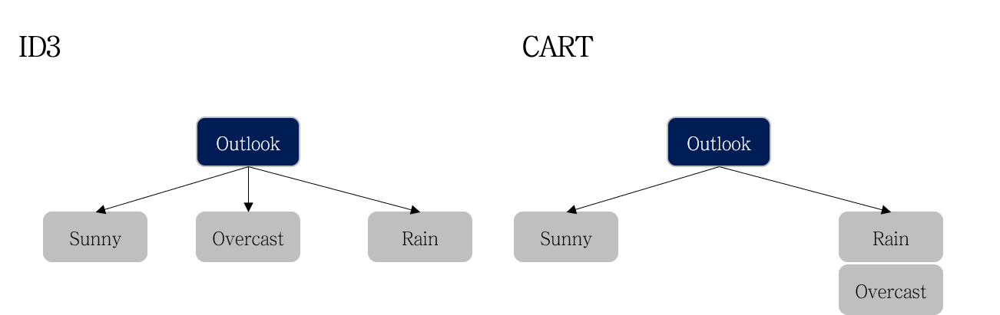

#채점 기준

1. 연구 목적 설정 및 데이터 설명 (classification, regression task 모두에 대해 실습 과제 수행)

2. Classification/Regression DT에서 사용한 주요 지표(entropy, gini, mse 등)에 대한 설명

3. 각각의 DT에 대해 하이퍼파라미터 튜닝을 올바르게 진행

4. 각각의 task에 대한 결과 및 성능 비교 (연구 목적에 따라 어떠한 성능 지표를 우선적으로 평가할지)

5. 각각의 tree에 대한 시각화 및 규칙 해석 진행

6. Feature importance 확인 및 결과 해석



* ID3, CART, CHAID, C4.5 등 추가적인 decision tree 알고리즘에 대한 차이 설명 및 실습을 진행하는 경우 채점 plus가 될 수 있습니다.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns 

# Classification

## 연구 목적

pre-HW 과제에서 와인 데이터를 의사결정나무 모형으로 분석한 논문을 확인할 수 있었고, 이에 이번 실습에서도 와인의 품질과 성분 데이터를 사용하고자 한다.

target을 `quality`로 설정하였고, 좋은 와인이 되기 위한 조건을 알아보기 위해 Decision Tree를 만들고 해석해보려 한다.

In [ ]:
import pandas as pd
wine = '/content/drive/Shareddrives/22-1 데이터마이닝/data_week9/winequalityN.csv'
wine_data_origin = pd.read_csv(wine) # original dataset

In [ ]:
wine_data_origin

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
wine_data_origin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [ ]:
wine_data = wine_data_origin.copy()
wine_data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


# Step 1. Preprocessing & EDA

In [ ]:
wine_data.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [ ]:
wine_data = wine_data.dropna(axis=0)
wine_data.isna().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [ ]:
wine_data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6491,red,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
wine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000,6463.000000
mean,7.217755,0.339589,0.318758,5.443958,0.056056,30.516865,115.694492,0.994698,3.218332,0.531150,10.492825,5.818505
std,1.297913,0.164639,0.145252,4.756852,0.035076,17.758815,56.526736,0.003001,0.160650,0.148913,1.193128,0.873286
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992330,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.997000,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


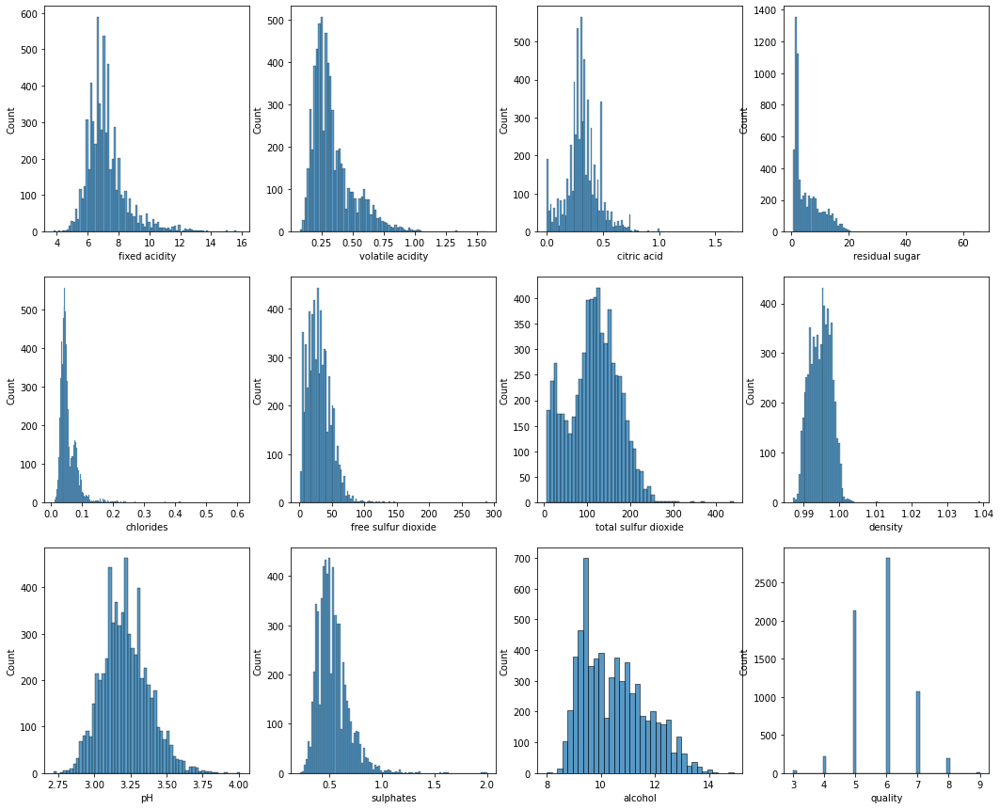

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(18, 15))
cols = wine_data.columns[1:]

for i in range(12):
    sns.histplot(wine_data[cols[i]], ax=ax[i//4, i%4])

### Binary Threshold

In [ ]:
wine_data.loc[wine_data['quality'] >= 6]

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6489,red,5.4,0.74,0.09,1.7,0.089,16.0,26.0,0.99402,3.67,0.56,11.6,6
6490,red,6.3,0.51,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6491,red,6.8,0.62,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
6494,red,6.3,0.51,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6


- 변수 중 type(white or red)은 quality에 영향을 주는 변수가 아니라 판단하여 drop했다.

- 결측치가 존재하는 Observation의 경우 결측치를 없애기 위해 해당 열을 drop했다.

In [ ]:
train_binary = wine_data.drop(columns=['type'], axis=1).copy()

train_binary.loc[train_binary['quality'] < 6, 'quality'] = 0
train_binary.loc[train_binary['quality'] >= 6, 'quality'] = 1
train_binary['quality'].value_counts()

1    4091
0    2372
Name: quality, dtype: int64

In [ ]:
t_features = train_binary.copy()
t_target = pd.DataFrame(t_features.pop('quality'))

t_features.info()
print('\n')
t_target.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6463 entries, 0 to 6496
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6463 non-null   float64
 1   volatile acidity      6463 non-null   float64
 2   citric acid           6463 non-null   float64
 3   residual sugar        6463 non-null   float64
 4   chlorides             6463 non-null   float64
 5   free sulfur dioxide   6463 non-null   float64
 6   total sulfur dioxide  6463 non-null   float64
 7   density               6463 non-null   float64
 8   pH                    6463 non-null   float64
 9   sulphates             6463 non-null   float64
 10  alcohol               6463 non-null   float64
dtypes: float64(11)
memory usage: 605.9 KB


<class 'pandas.core.frame.DataFrame'>
Int64Index: 6463 entries, 0 to 6496
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   qu

### Train Test Split (train_features, test_features, train_target, test_target)

In [ ]:
# train: test = 8:2 분리
from sklearn.model_selection import train_test_split
train_features, test_features , train_target, test_target = train_test_split(
    t_features, t_target, test_size = 0.2, random_state = 2022, stratify=t_target)

In [ ]:
print(len(train_features))
print(len(train_target))

print(len(test_features))
print(len(test_target))

5170
5170
1293
1293


In [ ]:
train_target['quality'].value_counts() # Y열의 데이터 개수 확인

1    3273
0    1897
Name: quality, dtype: int64

class 불균형이 심하여 샘플링을 진행하였다.

UnderSampling을 활용하였고, 정보의 손실을 감안하더라도 실제 관측치가 아닌 생성된 값이

분류 및 해석에 영향을 미칠 가능성을 배제하고자 Oversampling을 사용하지 않았다.

### Data shuffling & Undersampling (train_features_us, train_target_us)

In [ ]:
import sklearn
x_shuffled = sklearn.utils.shuffle(train_features, random_state=312)
y_shuffled = sklearn.utils.shuffle(train_target, random_state=312)

import imblearn
from imblearn.under_sampling import RandomUnderSampler
train_features_us, train_target_us = RandomUnderSampler(random_state=312).fit_resample(x_shuffled, y_shuffled)

In [ ]:
train_target_us['quality'].value_counts() # Y열의 데이터 개수 확인: total 2034개

0    1897
1    1897
Name: quality, dtype: int64

# Step 2. Decision Tree Modeling
- entropy (uncertainty)
  - $E=-\sum^k_{i=1}p_ilog_2(p_i)$

- gini index: 엔트로피와 같은 불순도 (Impurity) 지표
  - 경제적 불평등을 계수화
  - 분류가 잘 될 때 낮은 값
  - CART 알고리즘에서는 모든 조합에 대해 Gini index를 계산한 후, Gini index가 가장 낮은 지표를 찾아 분기
  - $Gini(t,D)=1-\sum_{l \in levels(t)}P(t=l)^2$

- Information gain
  - impurity의 개선 정도
    - decision tree에 의해 나누기 전의 impurity - 나누어진 subset들의 impurity
- pruning

### Model

In [ ]:
from sklearn.tree import DecisionTreeClassifier
'''
https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
'''
tree = DecisionTreeClassifier(random_state = 312)
# criterion = 'gini' 또는 'entropy' (default='gini')
# max_depth = None (default)
# min_samples_leaf = 1 (default)
# min_samples_split = None (default)
tree_fit = tree.fit(train_features_us, train_target_us)

In [ ]:
tree_fit

DecisionTreeClassifier(random_state=312)

In [ ]:
import pydotplus
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz
from IPython.display import Image # CART Tree 그림
import os

In [ ]:
feature_names = train_features_us.columns.tolist()
target_name = np.array(['Bad wine', 'Good wine'])

In [ ]:
dot_data = export_graphviz(tree,
                          filled = True,
                          rounded = True,
                          class_names = target_name,
                          feature_names = feature_names,
                          out_file = None)

graph = graph_from_dot_data(dot_data)
graph.write_png('tree.png') #Tree 이미지를 저장

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.751726 to fit



True

In [ ]:
dt_graph = pydotplus.graph_from_dot_data(dot_data)
Image(dt_graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.751726 to fit



In [ ]:
from sklearn.model_selection import cross_validate

scores = cross_validate(estimator = tree,
                       X=train_features_us,
                       y=train_target_us,
                       scoring = ['accuracy'],
                       cv=10,
                       n_jobs= -1,
                       return_train_score=False)

print('CV accuracy: %s' % scores['test_accuracy'])
print('CV aacuracy(Mean): %.3f (std: %.3f)' % (np.mean(scores['test_accuracy']),
                                     np.std(scores['test_accuracy'])))

CV accuracy: [0.72105263 0.72894737 0.73421053 0.7        0.76253298 0.70976253
 0.72031662 0.76253298 0.70184697 0.76781003]
CV aacuracy(Mean): 0.731 (std: 0.024)


In [ ]:
y_pred = tree.predict(test_features)

In [ ]:
y_pred

array([1, 1, 1, ..., 1, 0, 0])

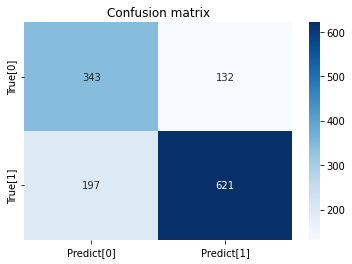

In [ ]:
from sklearn.metrics import confusion_matrix

confmat = pd.DataFrame(confusion_matrix(test_target, y_pred),
                      index=['True[0]', 'True[1]'],
                      columns=['Predict[0]', 'Predict[1]'])

f = sns.heatmap(confmat, annot=True, fmt='d', cmap=cm.Blues).set_title('Confusion matrix')

In [ ]:
from sklearn.metrics import classification_report

print('Classification Report')
print(classification_report(test_target, y_pred))

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.72      0.68       475
           1       0.82      0.76      0.79       818

    accuracy                           0.75      1293
   macro avg       0.73      0.74      0.73      1293
weighted avg       0.76      0.75      0.75      1293



In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

print('정확도 accuracy: %.3f' % accuracy_score(test_target, y_pred))
print('정밀도 precision: %.3f' % precision_score(y_true= test_target, y_pred=y_pred))
print('재현율 recall: %.3f' % recall_score(y_true=test_target, y_pred=y_pred))
print('F1-score: %.3f' % f1_score(y_true=test_target, y_pred=y_pred))
print('AUC: %.3f' % roc_auc_score(test_target, y_pred))

정확도 accuracy: 0.746
정밀도 precision: 0.825
재현율 recall: 0.759
F1-score: 0.791
AUC: 0.741


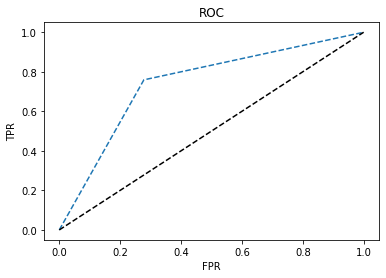

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve( test_target, tree.predict_proba(test_features)[:, 1] )

plt.plot(fpr, tpr, '--', label = 'Decision Tree')
plt.plot([0,1], [0,1], 'k--', label='random guess')
plt.plot([fpr],[tpr],'r-', ms=10)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.show()

# Step 3. Optimization

In [ ]:
from sklearn.pipeline import make_pipeline
pipe_tree = make_pipeline(DecisionTreeClassifier(random_state=312)) # default model로 시작
# pipeline은 hyper-parameter 값을 바꾸면서 여러 모델을 사용 가능.

In [ ]:
pipe_tree.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'decisiontreeclassifier', 'decisiontreeclassifier__ccp_alpha', 'decisiontreeclassifier__class_weight', 'decisiontreeclassifier__criterion', 'decisiontreeclassifier__max_depth', 'decisiontreeclassifier__max_features', 'decisiontreeclassifier__max_leaf_nodes', 'decisiontreeclassifier__min_impurity_decrease', 'decisiontreeclassifier__min_samples_leaf', 'decisiontreeclassifier__min_samples_split', 'decisiontreeclassifier__min_weight_fraction_leaf', 'decisiontreeclassifier__random_state', 'decisiontreeclassifier__splitter'])

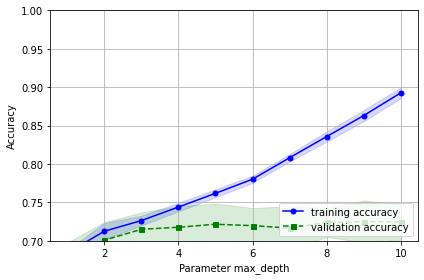

In [ ]:
from sklearn.model_selection import validation_curve

param_range = [1,2,3,4,5,6,7,8,9,10] # max_depth 범위 설정
train_scores, validation_scores = validation_curve(estimator = pipe_tree, #기본모형 선택
                                                   X = train_features_us,
                                                   y = train_target_us,
                                                   param_name = 'decisiontreeclassifier__max_depth', #pipe_tree.get_params().keys()에서
                                                   param_range=param_range,
                                                   scoring="accuracy",
                                                   cv=10)

train_mean = np.mean(train_scores, axis = 1)
train_std = np.std(train_scores, axis = 1)
validation_mean = np.mean(validation_scores, axis = 1)
validation_std = np.std(validation_scores, axis = 1)

plt.plot(param_range, train_mean,
        color='blue', marker='o',
        markersize=5, label='training accuracy')
plt.fill_between(param_range, 
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15,
                color='blue')
plt.plot(param_range, validation_mean,
        color='green', linestyle='--',
        marker='s', markersize=5,
        label='validation accuracy')
plt.fill_between(param_range,
                validation_mean + validation_std,
                validation_mean - validation_std,
                alpha=0.15, color='green')

plt.grid()
plt.xlabel('Number of max_depth')
plt.legend(loc='lower right')
plt.xlabel('Parameter max_depth')
plt.ylabel('Accuracy')
plt.ylim([0.7, 1.00]) # 보고싶은 구간 설정
plt.tight_layout()
plt.show()

# train accuracy와 validation accuracy가 모두 적절한 성능 & 오버피팅이 발생하기 전까지인 max_dept = 5 선택

### overfitting 여부 확인

train accuracy와 validation accuracy가 모두 적절한 성능 & 오버피팅이 발생하기 전까지인 max_dept = 5 선택

# Step 4. Grid Search

아래의 하이퍼파라미터 범위 내에서 탐색을 진행하였다.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_range1 = [1,2,3,4,5,6,7,8,9,10]
param_range2 = [10, 20, 30, 40, 50]
param_range3 = ['gini', 'entropy']

param_grid = [{'decisiontreeclassifier__max_depth': param_range1,
              'decisiontreeclassifier__min_samples_leaf': param_range2,
              'decisiontreeclassifier__criterion': param_range3}]

gs = GridSearchCV(estimator = pipe_tree,
                 param_grid = param_grid, # 찾고자하는 파라미터. dictionary 형식
                 scoring = 'accuracy', #  Classification일때  'accuracy','f1', Regression 일때 'neg_mean_squared_error','r2' 등
                 cv=10,
                 n_jobs= -1) # 병렬 처리; -1은 전부를 의미

gs = gs.fit(train_features_us, train_target_us)

print(gs.best_score_)
print(gs.best_params_)

0.7259054298014165
{'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10, 'decisiontreeclassifier__min_samples_leaf': 30}


## 최적의 모델 선택

In [ ]:
# 최적의 모델 선택
best_tree = gs.best_estimator_
best_tree.fit(train_features_us, train_target_us)

Pipeline(steps=[('decisiontreeclassifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=10,
                                        min_samples_leaf=30,
                                        random_state=312))])

In [ ]:
best_tree_for_graph = DecisionTreeClassifier(criterion='gini', max_depth=10, min_samples_leaf=40, random_state = 2022)

In [ ]:
best_tree_for_graph.fit(train_features_us, train_target_us)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=40, random_state=2022)

In [ ]:
y_pred = best_tree.predict(test_features)

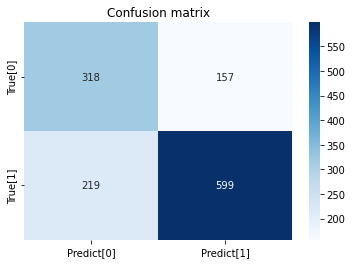

In [ ]:
confmat = pd.DataFrame(confusion_matrix(test_target, y_pred),
                      index=['True[0]', 'True[1]'],
                      columns=['Predict[0]', 'Predict[1]'])

f = sns.heatmap(confmat, annot=True, fmt='d', cmap=cm.Blues).set_title('Confusion matrix')

In [ ]:
from sklearn.metrics import classification_report

print('Classification Report')
print(classification_report(test_target, y_pred))

Classification Report
              precision    recall  f1-score   support

           0       0.59      0.67      0.63       475
           1       0.79      0.73      0.76       818

    accuracy                           0.71      1293
   macro avg       0.69      0.70      0.69      1293
weighted avg       0.72      0.71      0.71      1293



In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

print('정확도 accuracy: %.3f' % accuracy_score(test_target, y_pred))
print('정밀도 precision: %.3f' % precision_score(y_true= test_target, y_pred=y_pred))
print('재현율 recall: %.3f' % recall_score(y_true=test_target, y_pred=y_pred))
print('F1-score: %.3f' % f1_score(y_true=test_target, y_pred=y_pred))
print('AUC: %.3f' % roc_auc_score(test_target, y_pred))

정확도 accuracy: 0.709
정밀도 precision: 0.792
재현율 recall: 0.732
F1-score: 0.761
AUC: 0.701


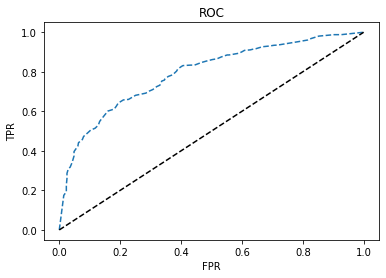

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve( test_target, best_tree.predict_proba(test_features)[:, 1] )

plt.plot(fpr, tpr, '--', label = 'Decision Tree')
plt.plot([0,1], [0,1], 'k--', label='random guess')
plt.plot([fpr],[tpr],'r-', ms=10)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.show()

ROC Curve가 좌측 상단에 더 가까운 형태를 띄고 있으므로 모델이 민감도와 특이도 모두 좋은 수치를 보이고 있다고 할 수 있다.

In [ ]:
feature_names = train_features_us.columns.tolist()
target_name = np.array(['Bad wine', 'Good wine'])

In [ ]:
dot_data_best = export_graphviz(best_tree_for_graph,
                          filled = True,
                          rounded = True,
                          class_names = target_name,
                          feature_names = feature_names,
                          out_file = None)

graph_best = graph_from_dot_data(dot_data_best)
graph.write_png('tree_best.png') #Tree 이미지를 저장

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.751726 to fit



True

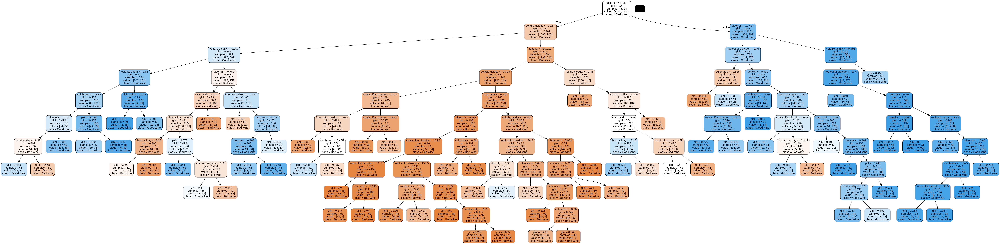

In [ ]:
dt_graph_best = pydotplus.graph_from_dot_data(dot_data_best)
Image(dt_graph_best.create_png())

- [feature_importance](https://soohee410.github.io/iml_tree_importance): 불순도를 가장 크게 감소시키는 변수의 중요도가 가장 큼
  - 연속형 변수 또는 카테고리 개수가 매우 많은 변수들(high cardinality)의 중요도를 더욱 부풀릴 가능성이 높음
  - train 과정에서 얻은 중요도이기 때문에, test 데이터셋에서는 이 변수 중요도가 어떻게 변하는 지 알 수 없음 
  - 어떤 변수가 어떤 방향으로(positive or negative)로 영향일 미치는지 판단을 할 수 없음 -> [shap value](https://todayisbetterthanyesterday.tistory.com/56)

### Feature importance 해석

-첫 번째 분할부터 세 번째 분할까지는 Feature importance가 가장 높게 나타난 상위 2개의 변수(alchol과 volatile acidity)가 트리를 분기하는 척도로 가장 많이 사용되었다.

-네 번째 분할부터 다섯 번째 분할까지는 Feature importance가 높게 나타난 상위 2개의 변수를 제외한 free sulfur dioxide, sulphates, residual sugar를 포함한 density, total sulfur dioxide, critic acid 등이 트리를 분기하는 척도로 사용되었다. 

-alchol 값이 10.65 이하인 와인 중 residual sugar 값이 9.65이하인 와인은 Good wine으로 분류되었다. 

-alchol 값이 10.65보다 크고 11.617 이하인 와인 중에서는 free sulfur dioxide 값이 10.5보다 큰 와인이 Good wine으로 분류되었다.

-alchol 값이 11.617보다 큰 와인은 모두 Good wine으로 분류되었다. 



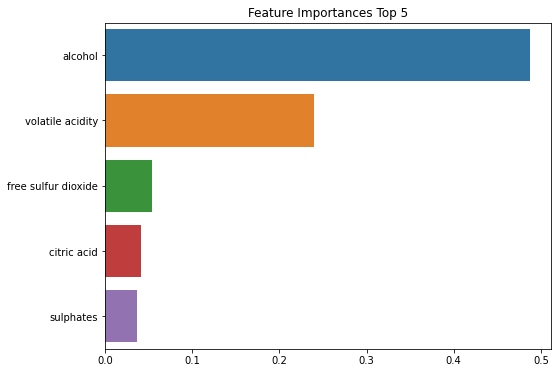

In [ ]:
# Feature Importance

import seaborn as sns
feature_importance_values = best_tree_for_graph.feature_importances_
feature_importances = pd.Series(feature_importance_values, index=train_features_us.columns)
feature_top5 = feature_importances.sort_values(ascending=False)[:5]

plt.figure(figsize=[8, 6])
plt.title('Feature Importances Top 5')
sns.barplot(x=feature_top5, y=feature_top5.index)
plt.show()

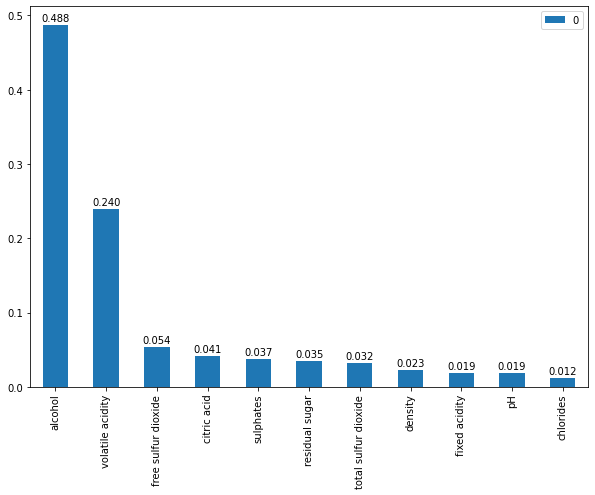

In [ ]:
ax = pd.DataFrame(feature_importances.sort_values(ascending=False)).plot(kind='bar', figsize=(10, 7))
for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate("%.3f"%(height), (left+width/2, height+0.005), ha='center')

-Feature importance는 alchol과 volatile acidity 두 변수가 가장 높게 나타났으며 alchol과 volatile acidity가 트리를 분기하는 과정에서 모델에 가장 높은 기여를 한 두 변수라고 할 수 있다.   
-나머지 free sulfur dioxide, sulphates, residual sugar의 변수들의 중요도는 비슷한 값으로 측정되었다. 

### Shap value 해석

In [ ]:
import skimage
skimage.__version__

'0.18.3'

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 23.0 MB/s 


In [ ]:
# !pip uninstall shap

In [ ]:
# shap value를 이용하여 각 변수의 영향도 파악

# !pip install shap (에러 발생시, skimage version 확인 (0.14.2 이상 권장))
# import skimage -> skimage.__version__ (skimage version 확인)
# skimage version upgrade -> !pip install --upgrade scikit-image

# shap value 
import shap

In [ ]:
# shap.initjs() : 시각화 하는 모든 셀마다 필요 (Colab 기준)
shap.initjs()
explainer = shap.TreeExplainer(best_tree_for_graph) # Tree model Shap Value 확인 객체 지정
shap_values = explainer.shap_values(train_features_us) # Shap Values 계산

Force_plot

- 특정 데이터 하나 & 전체 데이터에 대해, Shapley Value를 1차원 평면에 정렬해서 보여준다.

In [ ]:
train_features_us.iloc[0,:]

fixed acidity             6.80000
volatile acidity          0.30000
citric acid               0.22000
residual sugar            6.20000
chlorides                 0.06000
free sulfur dioxide      41.00000
total sulfur dioxide    190.00000
density                   0.99858
pH                        3.18000
sulphates                 0.51000
alcohol                   9.20000
Name: 0, dtype: float64

In [ ]:
# 해당 셀의 경우 이번 싨습 중 !pip install shap을 두 번 실행하여 colab 실습 환경 상에서 
# shap_values 가 array객체 두 개가 이어진 형태로 출력이 되었고, 이를 해결하고자 .pop() 메서드를 활용하였습니다.
# 일반적인 실습환경에서는 실행하지 않는 부분입니다.

shap_values.pop()
for item in shap_values:
  shap_values=item

In [ ]:
shap_values

array([[ 0.00070369,  0.02730387,  0.01531472, ...,  0.00436257,
         0.01268949,  0.22795604],
       [ 0.01222972,  0.07743733, -0.01862479, ...,  0.00461572,
         0.03583338,  0.10618287],
       [-0.0148458 ,  0.13247112, -0.00080972, ..., -0.00332534,
         0.06704797,  0.20784353],
       ...,
       [-0.00377278,  0.02213826,  0.01206598, ...,  0.00205738,
         0.02483829, -0.47900217],
       [-0.00567447, -0.35229097,  0.00062383, ..., -0.04722814,
        -0.04649928, -0.01793084],
       [ 0.01087704, -0.443952  , -0.0500155 , ...,  0.0208168 ,
         0.00253214,  0.08787133]])

In [ ]:
# 특정 Observation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features_us.iloc[0,:])

`shap.force_plot`을 활용하면 위 그림처럼 특정 관측치에 대해 각 변수가 어느 정도의 영향력을 미치는 지 양/음의 영향력을 모두 확인 가능하다.

In [ ]:
# 일부분
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:30,:], train_features_us.iloc[:30,:])

위 force_plot은 그래프의 x축과 y축을 원하는 방식으로 선택하여 값을 관찰 가능하다.

summary plot은 특성 중요도(feature importance)와 특성 효과(feature effects)를 결합한다.

- summary plot의 각 점은 특성에 대한 Shapley value와 관측치
- x축은 Shapley value에 의해 결정되고 y축은 특성에 의해 결정됨
- 색은 특성의 값을 낮음에서 높음까지 나타내며, 겹치는 점이 y축 방향으로 내포됨에 따라 특성 당 Shapley value의 분포를 알 수 있음
- 특성은 중요도에 따라 정렬됨

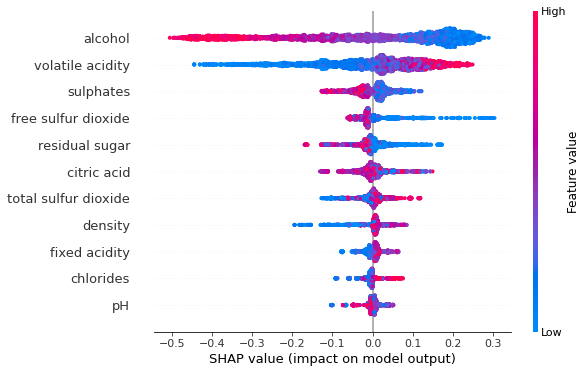

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, train_features_us)

위의 summary plot을 확인해보면 중요도가 큰 변수는 alcohol, volatile acidity등의 순으로 나타나고,

이러한 점이 Decision Tree의 초기 Branching이 alcohol로 이루어진 이유를 짐작할 수 있게 했다.

대체적으로 살펴보았을 때 alcohol과 와인의 평점은 반비례하는 듯한 양상을 나타내고 있고,

반대로 volatile acidity의 경우는 그 값이 클 수록 와인의 좋은 평점에 높게 기여한다는 점을 알 수 있다.

이 값은 단순한 설명 지표로, 각 변수의 결과에 대한 기여도를 나타내기 때문에 해석에는 유의가 필요하다.


dependency plot을 이용하면 주요변수들 사이의 상관관계도 확인해볼 수 있다.
대체로 두 변수 모두 같이 움직이는 경향성을 보여준다.

In [ ]:
shap.initjs()
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))  # 각각의 Feature 에 대해 shap value 다 더한 것 

# make SHAP plots of the three most important features
for i in range(2):
    shap.dependence_plot(top_inds[i], shap_values, train_features_us)


# Continuous

## 연구 목적

pre-HW 과제에서 와인 데이터를 의사결정나무 모형으로 분석한 논문을 확인할 수 있었고, 이에 이번 실습에서도 와인의 품질과 성분 데이터를 사용하고자 한다.

target을 `alcohol`로 설정하였고, 위의 Classification에서 `alcohol`변수가 주요 변수로 등장함에 따라 주요 변수를 결정하는 요인들은 어떤 것들이 있을 지 확인해보고자 하였다.

In [ ]:
train_continuous = wine_data.drop(columns=['type'], axis=1).copy()
train_continuous

In [ ]:
t_features = train_continuous.copy()
t_target = pd.DataFrame(t_features.pop('alcohol'))

t_features.info()
print('\n')
t_target.info()

### Train Test Split (train_features, test_features, train_target, test_target)

In [ ]:
# train: test = 8:2 분리
from sklearn.model_selection import train_test_split
train_features, test_features , train_target, test_target = train_test_split(
    t_features, t_target, test_size = 0.2, random_state = 312)

In [ ]:
print(len(train_features))
print(len(train_target))

print(len(test_features))
print(len(test_target))

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.distplot(train_target.loc[pd.DataFrame(train_target)['alcohol'].notnull(), 'alcohol'])
plt.title('alcohol')
plt.show()

##Model

In [ ]:
from sklearn.tree import DecisionTreeRegressor
'''
https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html
criterion = 'mse' 또는 'mae' (default='mse')
max_depth = None (default)
min_samples_leaf = 1 (default)
min_samples_split = None (default)
'''
tree = DecisionTreeRegressor(random_state = 312)

tree_fit = tree.fit(train_features, train_target)

In [ ]:
tree_fit

In [ ]:
from sklearn.pipeline import make_pipeline
pipe_tree = make_pipeline(DecisionTreeRegressor(random_state=312)) # default model로 시작
# hyper-parameter 값을 바꾸면서 여러 모델 사용

In [ ]:
pipe_tree.get_params().keys()

## 하이퍼파라미터 튜닝

train_mse와 validation_mse를 비교하였을 때 depth가 19인 지점부터 오버피팅이 발생할 수 있음을 확인하였고, param_range1을 11부터 20까지로 설정하였다.
param_range2의 경우 trial&error로 탐색하였는데, 초기에는 [10,20,30,40,50]로 시도하였을 때 10이 최적으로 나온 것을 확인하여 더 작은 범위에서 시도하면 더 최적의 값이 나올 가능성을 확인하였고, 그 결과 1,3,5,7,10으로 변경하여 최적의 값을 탐색했다.

In [ ]:
from sklearn.model_selection import validation_curve
import numpy as np

param_range = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20] # max_depth 범위 설정
train_scores, validation_scores = validation_curve(estimator = pipe_tree, #기본모형 선택
                                                   X = train_features,
                                                   y = train_target,
                                                   param_name = 'decisiontreeregressor__max_depth', #pipe_tree.get_params().keys()에서 비교 대상 선정
                                                   param_range=param_range,
                                                   scoring= "neg_mean_squared_error",
                                                   cv=10)

train_mean = (np.mean(-train_scores, axis = 1))
train_std = np.std(-train_scores, axis = 1)
validation_mean = np.mean(-validation_scores, axis = 1)
validation_std = np.std(-validation_scores, axis = 1)

plt.plot(param_range, train_mean,
        color='blue', marker='o',
        markersize=5, label='training MSE')
plt.fill_between(param_range, 
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15,
                color='blue')
plt.plot(param_range, validation_mean,
        color='green', linestyle='--',
        marker='s', markersize=5,
        label='validation MSE')
plt.fill_between(param_range,
                validation_mean + validation_std,
                validation_mean - validation_std,
                alpha=0.15, color='green')

plt.grid()
plt.xlabel('Number of max_depth')
plt.legend(loc='lower right')
plt.xlabel('Parameter max_depth')
plt.ylabel('MSE')
plt.ylim([-2.00, 2.00])
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
param_range1 = [11,12,13,14,15,16,17,18,19,20]
param_range2 = [1,3,5,7,10]
param_range3 = ['mse', 'mae'] # 'explained_variance' 등도 가능

param_grid = [{'decisiontreeregressor__max_depth': param_range1,
              'decisiontreeregressor__min_samples_leaf': param_range2,
              'decisiontreeregressor__criterion': param_range3}]

gs = GridSearchCV(estimator = pipe_tree,
                 param_grid = param_grid, # 찾고자하는 파라미터. dictionary 형식
                 scoring = 'neg_mean_squared_error', # Regression 일때 'neg_mean_squared_error','r2' 등
                 cv=10,
                 n_jobs= -1)

gs = gs.fit(train_features, train_target)

print(-gs.best_score_)
print(gs.best_params_)

## 최적의 모델 선택

In [ ]:
best_tree = gs.best_estimator_ # 최적의 파라미터로 모델 생성
best_tree.fit(train_features, train_target)

In [ ]:
best_tree_for_graph = DecisionTreeRegressor(criterion='mse', max_depth=19, min_samples_leaf=5, random_state = 312)
best_tree_for_graph.fit(train_features, train_target)

In [ ]:
y_pred = best_tree.predict(test_features)

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error
print('R squared: %.3f' % r2_score(test_target, y_pred))
print('MSE: %.3f' % mean_squared_error(test_target,y_pred))

# 참고: https://scikit-learn.org/stable/modules/classes.html?highlight=sklearn%20metrics#module-sklearn.metrics

### 성능 확인

$R^2$값이 1에 가까울 수록 회귀 모델의 설명력이 높고, MSE는 잔차의 크기를 나타내는 지표로 이 값이 작을 수록 모델이 잘 적합되었음을 뜻한다.

확인 결과 $R^2$ > 0.7로 높은 값을 보였고, MSE 또한 0.3 정도로 크지 않았기에 모델이 잘 적합됨을 확인할 수 있었다.

In [ ]:
import numpy as np
feature_names = train_features.columns.tolist()
target_name = np.array(['alcohol'])

In [ ]:
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

dot_data_best = export_graphviz(best_tree_for_graph,
                          filled = True,
                          rounded = True,
                          class_names = target_name,
                          feature_names = feature_names,
                          out_file = None)

graph_best = graph_from_dot_data(dot_data_best)
graph_best.write_png('tree_best_regression.png') #Tree 이미지를 저장

In [ ]:
dt_graph_best = pydotplus.graph_from_dot_data(dot_data_best)
Image(dt_graph_best.create_png())

### Feature importance 해석

-max depth를 19로 설정한 만큼 다양한 feature들이 classification에 기여한 것을 확인할 수 있다.

-상위 분할(depth가 작은 것들)에는 대체로 feature importance가 큰 density, residual sugar, total sulfur dioxide, fixed acidity, pH가 쓰인 것을 볼 수 있다.

-하위 분할(depth가 큰 것들)에는 대체로 feature importance가 작은 나머지 변수들이 사용된 것을 확인할 수 있다.

-density가 0.992보다 작으면 대체로 알코올 농도가 높은 편이고 0.992보다 크면 낮은 편이나 하위 세부 분류에 있어서 feature들에 의해 다양하게 분류되는 것을 확인할 수 있다. 

In [ ]:
# Feature Importance

import seaborn as sns
feature_importance_values = best_tree_for_graph.feature_importances_
feature_importances = pd.Series(feature_importance_values, index=train_features.columns)
feature_top5 = feature_importances.sort_values(ascending=False)[:5]

plt.figure(figsize=[8, 6])
plt.title('Feature Importances Top 5')
sns.barplot(x=feature_top5, y=feature_top5.index)
plt.show()

In [ ]:
feature_importances.sort_values(ascending=False)

-feature importance 순서가 density, residual sugar, total sulfur dioxide, fixed acidity, pH, sulphates, quality, citric acid, volatile acidity, chlorides, free sulfur dioxide로 나왔는데, 그 중 density가 가장 높게 나타났으며 모델 분기에 가장 높은 기여를 했다고 볼 수 있다.

-나머지 변수들의 중요도는 비슷한 값으로 측정되었다.

-feature importance는 density가 압도적으 가장 높게 나왔지만 나머지 변수들이 모델에 기여한 것을 확인할 수 있으며, 실제로 mapping 과정을 보면 변수들이 모두 분기의 기준이 된 것을 확인할 수 있다.

# ID3, CART, CHAID, C4.5 등 추가적인 decision tree 알고리즘에 대한 차이 설명

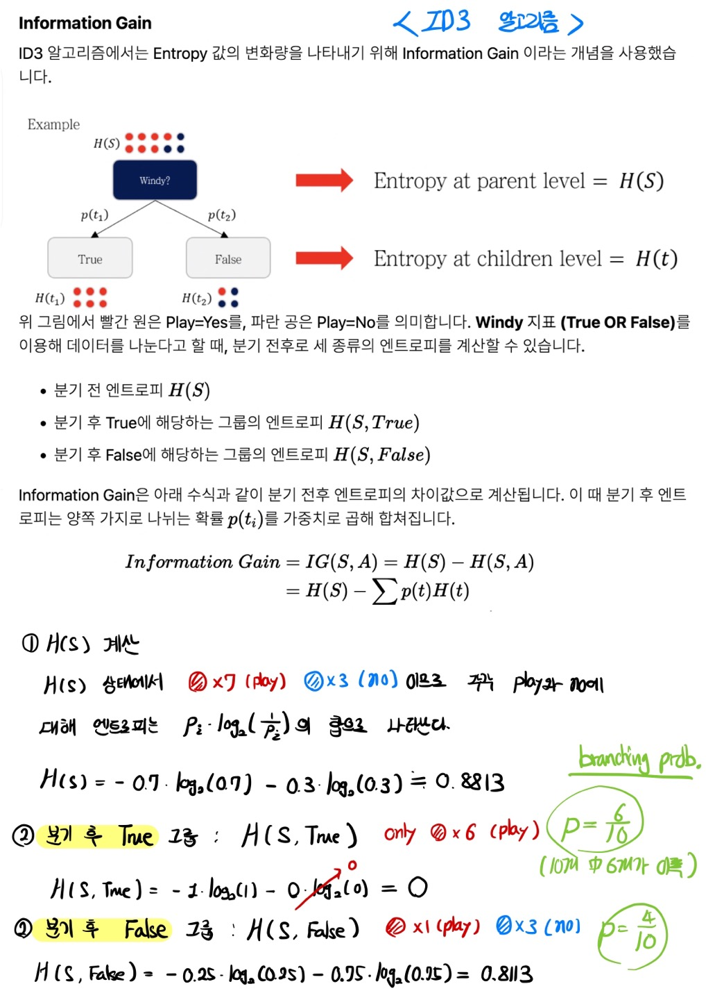

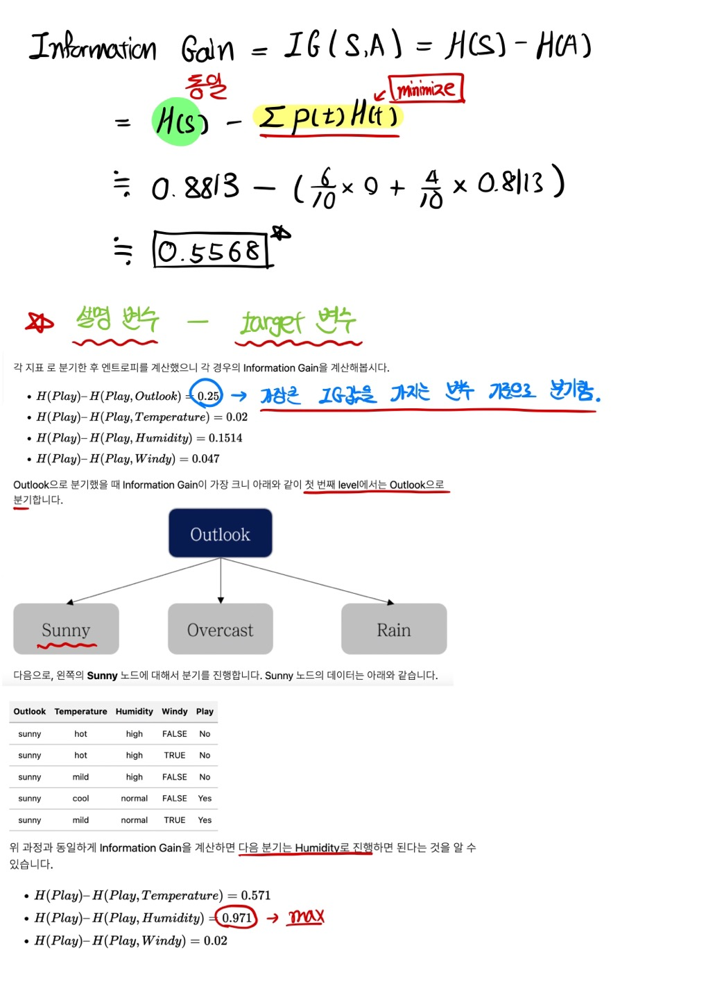

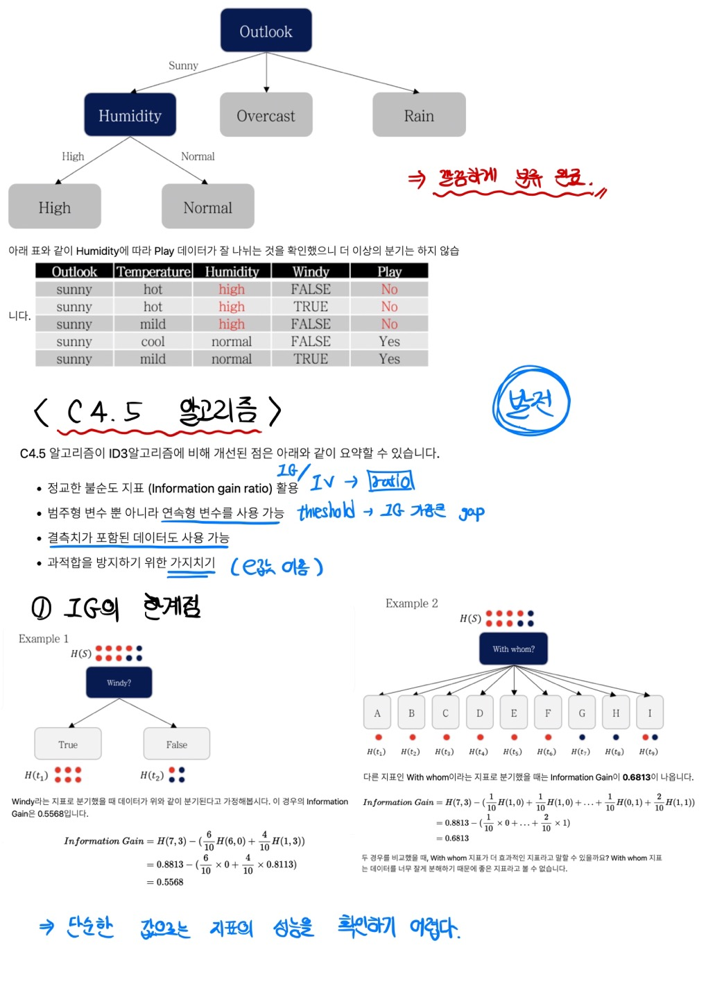

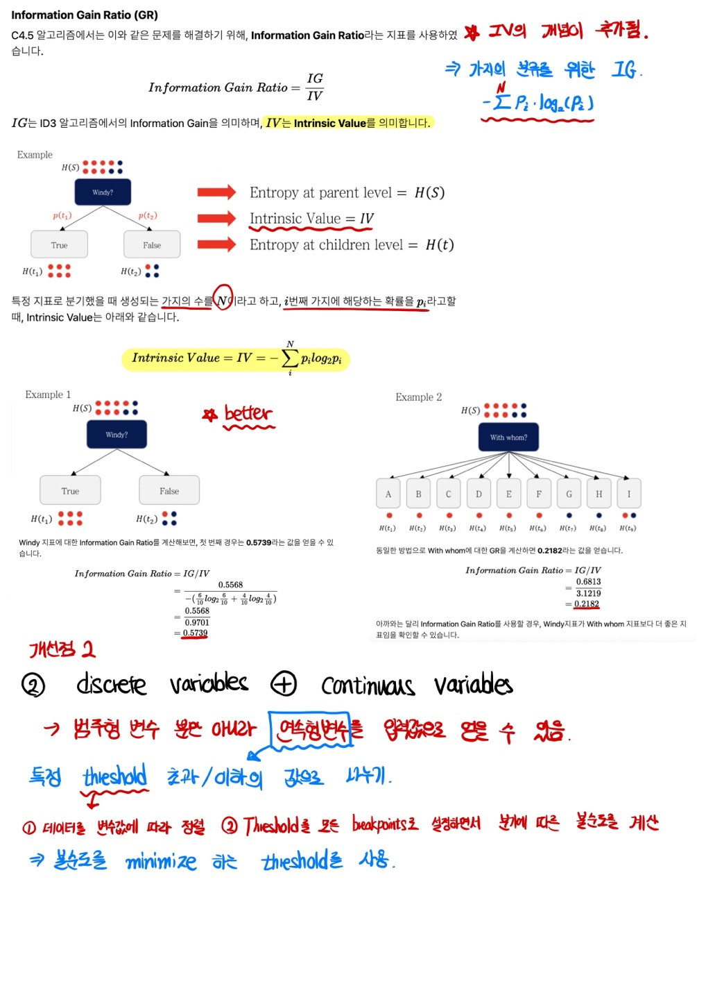

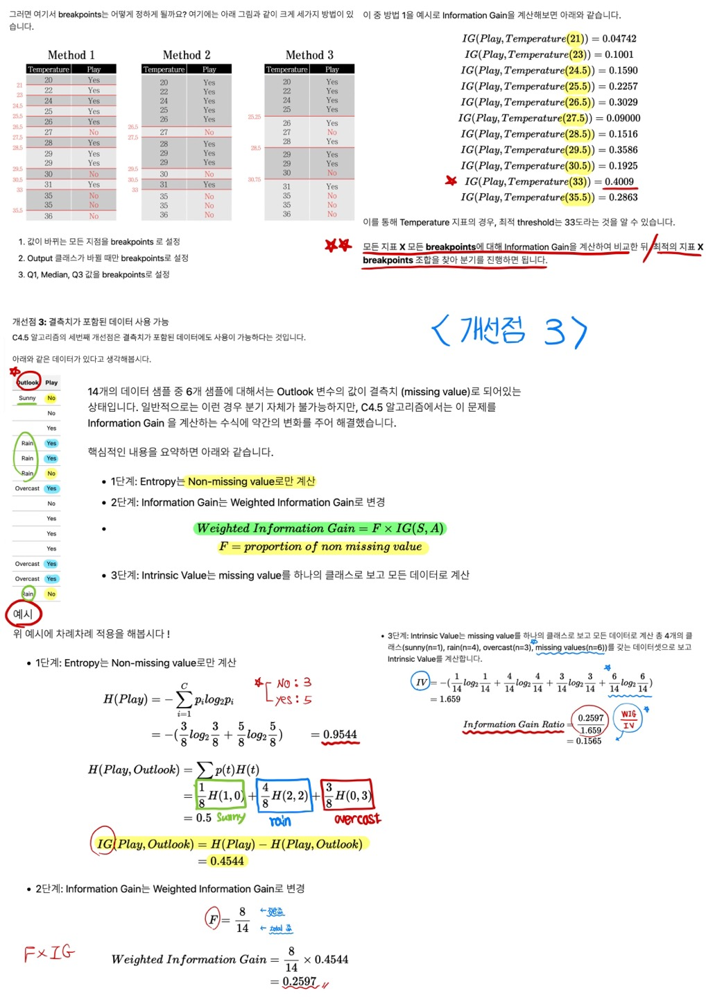

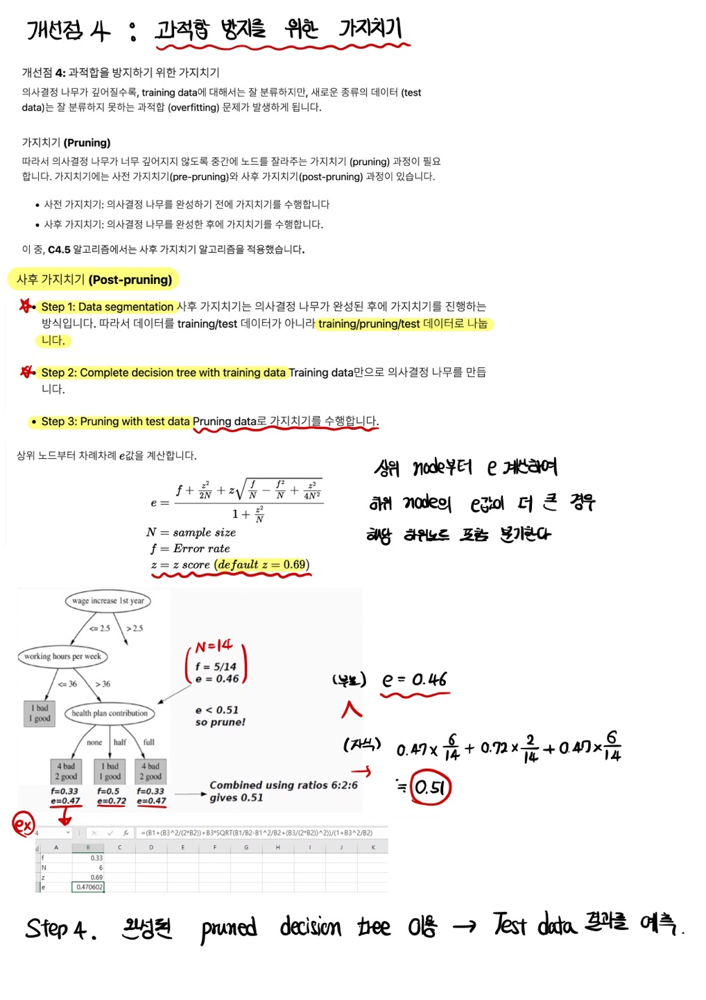

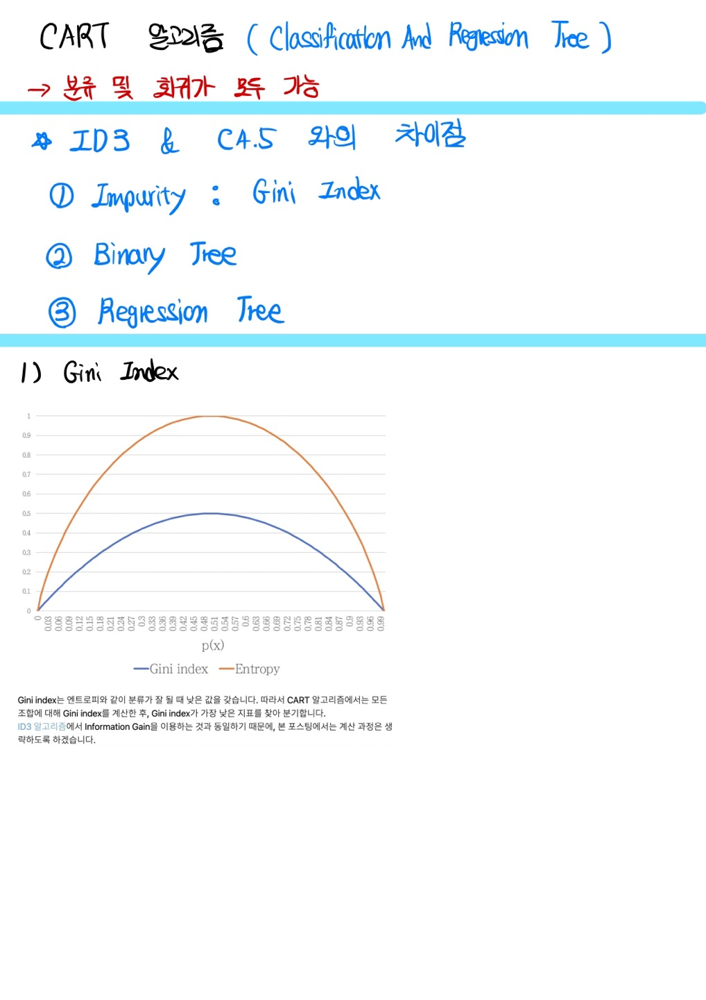

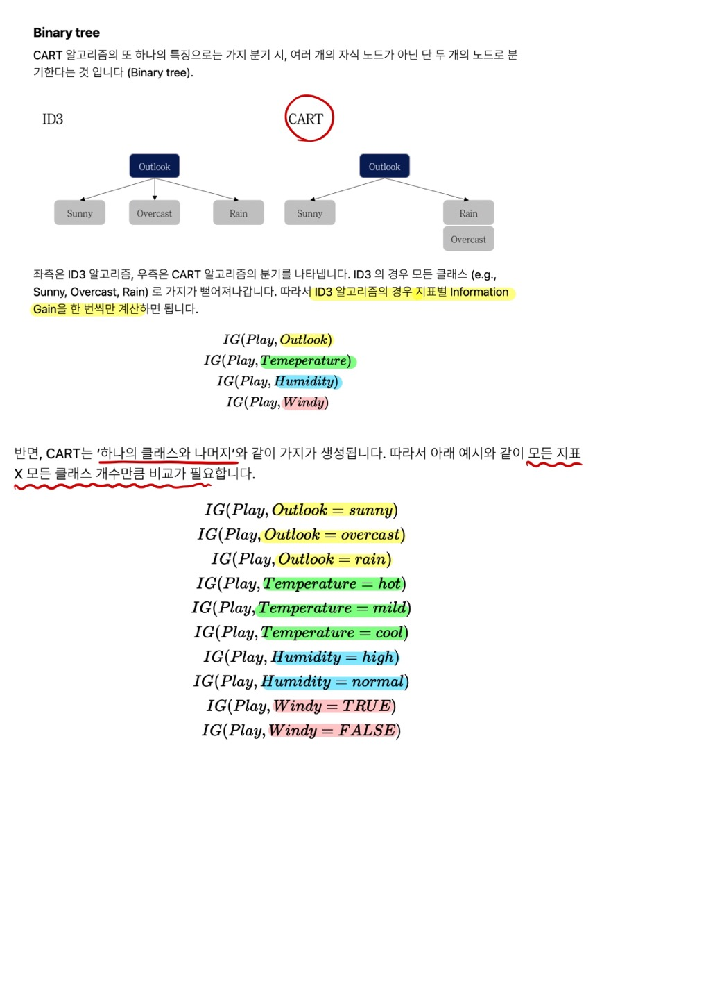

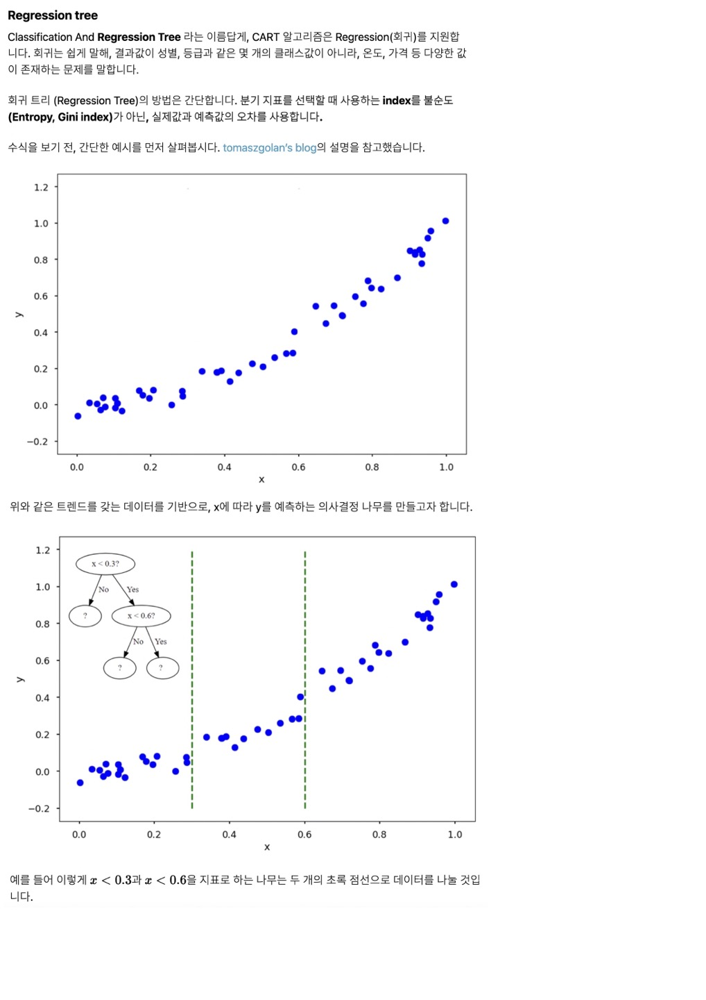

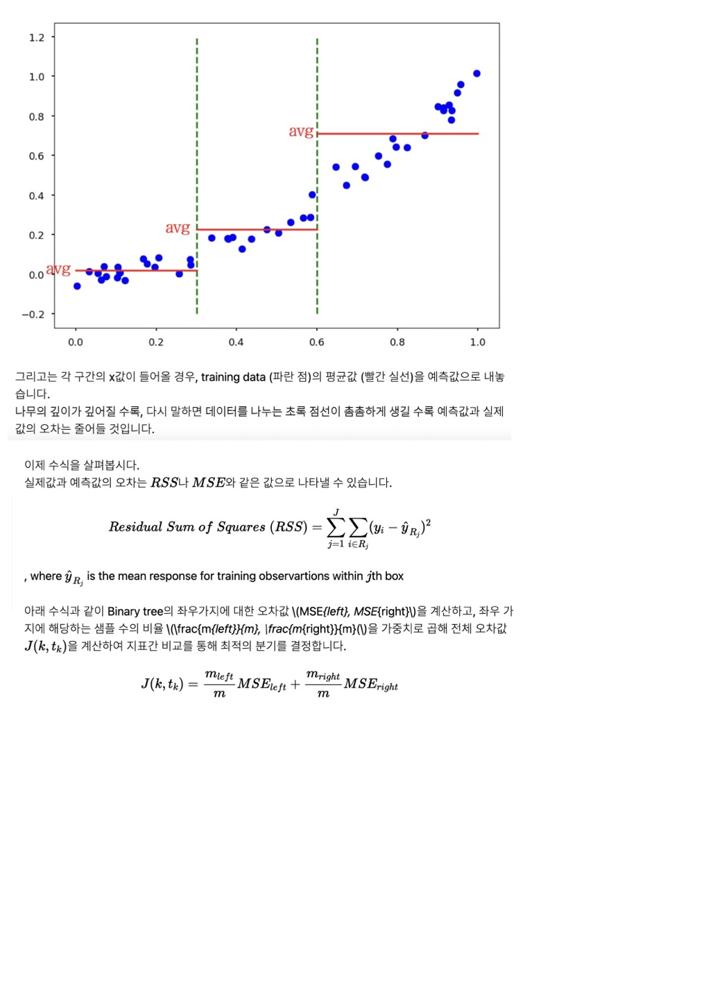

Decision Tree의 단점 : 과적합에 취약함.
- 이러한 과적합을 막기 위해 가지치기 (pruning)를 수행함.

#Reference

2022_DM_HW1~HW6[일석사조]

[ID3 알고리즘](https://tyami.github.io/machine%20learning/decision-tree-2-ID3/)

[CART 알고리즘](https://tyami.github.io/machine%20learning/decision-tree-4-CART/)


[C4.5 알고리즘](https://tyami.github.io/machine%20learning/decision-tree-3-c4_5/)

[shapely value1](https://velog.io/@tobigs_xai/2%EC%A3%BC%EC%B0%A8-SHAP-SHapley-Additive-exPlanation)

[shapely value2](https://datanetworkanalysis.github.io/2019/12/24/shap3)